# <font color='red'>Projeto</font>
# <font color='blue' >Prevendo Customer Churn em Operadoras de Telecom </font>

### Problema de Negócio:
Prever se o cliente abandonará o relacionamento comercial com a empresa

In [1]:
# Importando pacotes
import pandas as pd # Manipulação de dados
import numpy as np # Computação numérica
import seaborn as sn # Gráficos estatísticos
import matplotlib.pyplot as plt # Gráficos
from pandas_profiling import ProfileReport # Relatório dos dados

import warnings # Remover as mensagens de aviso
warnings.filterwarnings('ignore')

#Para que os gráficos sejam visualizados aqui no jupyter notebook
%matplotlib inline

In [2]:
# Carregando o arquivo csv e atribuindo a uma variável chamada train
train = pd.read_csv('projeto4_telecom_treino.csv', index_col=[0])

In [3]:
# Visualizando as primeiras 5 linhas do dataset
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,area_code_415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,no
2,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
3,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
4,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
5,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no


In [4]:
# Formato do arquivo: quantidade de linhas e colunas
print('O dataset tem %d linhas' %train.shape[0])
print('O dataset tem %d colunas' %train.shape[1])

O dataset tem 3333 linhas
O dataset tem 20 colunas


In [5]:
# Informações do dataset: tipos de dados, memória usado pelo dataset, quantidade de linhas e colunas
train.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3333 entries, 1 to 3333
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          3333 non-null   object 
 1   account_length                 3333 non-null   int64  
 2   area_code                      3333 non-null   object 
 3   international_plan             3333 non-null   object 
 4   voice_mail_plan                3333 non-null   object 
 5   number_vmail_messages          3333 non-null   int64  
 6   total_day_minutes              3333 non-null   float64
 7   total_day_calls                3333 non-null   int64  
 8   total_day_charge               3333 non-null   float64
 9   total_eve_minutes              3333 non-null   float64
 10  total_eve_calls                3333 non-null   int64  
 11  total_eve_charge               3333 non-null   float64
 12  total_night_minutes            3333 non-null   f

In [6]:
# Checando se o dataset tem valores duplicados
train.duplicated().sum()

0

In [7]:
# Informações estatísticas do dataset
train.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


# Análise exploratória

### Vamos nos aprofundar na variável estado, e ver a relação com a variável churn, a qual iremos prever.

In [8]:
# Quantidade de estados diferentes no dataset
print('Temos %s estados diferentes no dataset' %train['state'].nunique())

Temos 51 estados diferentes no dataset


In [9]:
# Quantidade de vezes que os mesmos estados aparecem no dataset
train['state'].value_counts()

WV    106
MN     84
NY     83
AL     80
OH     78
OR     78
WI     78
VA     77
WY     77
CT     74
MI     73
VT     73
ID     73
UT     72
TX     72
IN     71
KS     70
MD     70
MT     68
NC     68
NJ     68
NV     66
WA     66
CO     66
RI     65
MA     65
MS     65
AZ     64
MO     63
FL     63
NM     62
ND     62
ME     62
NE     61
DE     61
OK     61
SD     60
SC     60
KY     59
IL     58
NH     56
AR     55
GA     54
DC     54
TN     53
HI     53
AK     52
LA     51
PA     45
IA     44
CA     34
Name: state, dtype: int64

In [10]:
# Vamos ver os 10 estados que mais tiveram rotatividade de cliente
g=train[train['churn']=='yes']\
    .groupby(['state'])['churn']\
    .count()\
    .sort_values(ascending=False)[:10]\
    .reset_index()

print(g)

  state  churn
0    TX     18
1    NJ     18
2    MD     17
3    MI     16
4    NY     15
5    MN     15
6    MS     14
7    MT     14
8    WA     14
9    SC     14


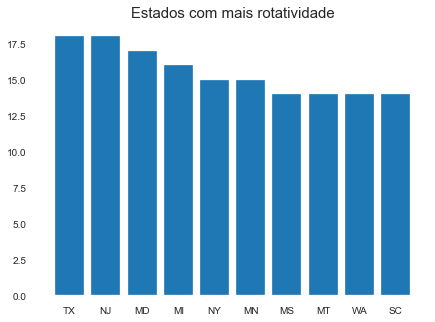

In [11]:
plt.figure(figsize=(7,5))
plt.bar(x=g.state.values, height=g.churn.values)
plt.title('Estados com mais rotatividade', fontsize=15);

In [12]:
# Agora os 10 estados que menos tiveram rotatividade
g=train[train['churn']=='yes']\
    .groupby(['state'])['churn']\
    .count()\
    .sort_values(ascending=True)[:10]\
    .reset_index()
print(g)

  state  churn
0    AK      3
1    IA      3
2    HI      3
3    AZ      4
4    LA      4
5    NE      5
6    VA      5
7    TN      5
8    DC      5
9    IL      5


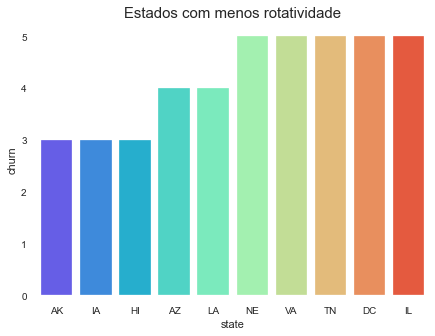

In [13]:
plt.figure(figsize=(7,5))
sn.barplot(data=g, x='state', y='churn', palette='rainbow')
plt.title('Estados com menos rotatividade', fontsize=15);

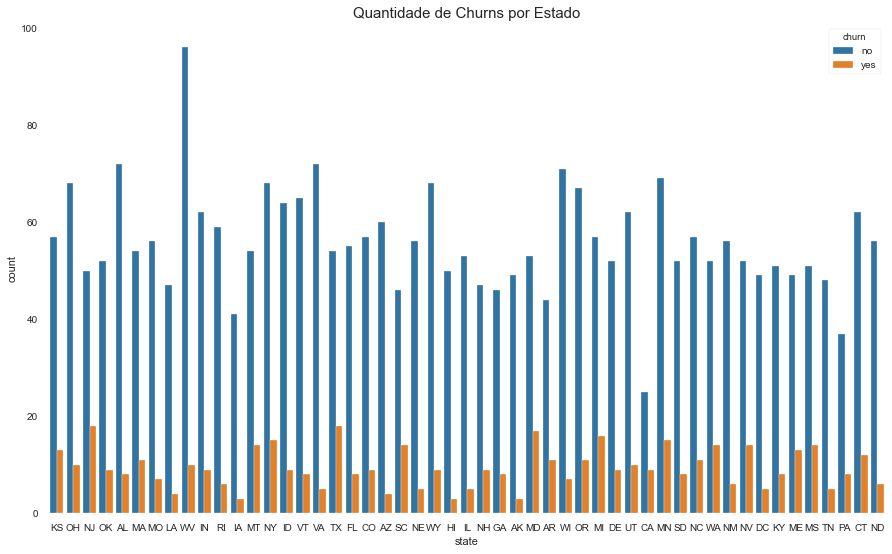

In [14]:
# Gráfico com todos os estados e a quantidade de churns
plt.figure(figsize=(15,9))
sn.countplot(x='state', hue='churn', data=train)
plt.title('Quantidade de Churns por Estado', fontsize=15);

In [15]:
# Proporção de churns por estado
train.groupby('state')['churn'].value_counts(normalize =True)

state  churn
AK     no       0.942308
       yes      0.057692
AL     no       0.900000
       yes      0.100000
AR     no       0.800000
                  ...   
WI     yes      0.089744
WV     no       0.905660
       yes      0.094340
WY     no       0.883117
       yes      0.116883
Name: churn, Length: 102, dtype: float64

### Variável account_length

In [16]:
# Visualizando o dataset novamente
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,area_code_415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,no
2,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
3,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
4,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
5,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no


In [17]:
# Quantas vezes os valores únicos da variável aparecem
print('Mostrando os 20 valores que mais apareceram')
train['account_length'].value_counts()[:20]

Mostrando os 20 valores que mais apareceram


105    43
87     42
93     40
101    40
90     39
86     38
95     38
116    37
100    37
112    36
107    36
99     36
120    35
127    35
123    35
106    34
122    34
88     34
103    33
80     33
Name: account_length, dtype: int64

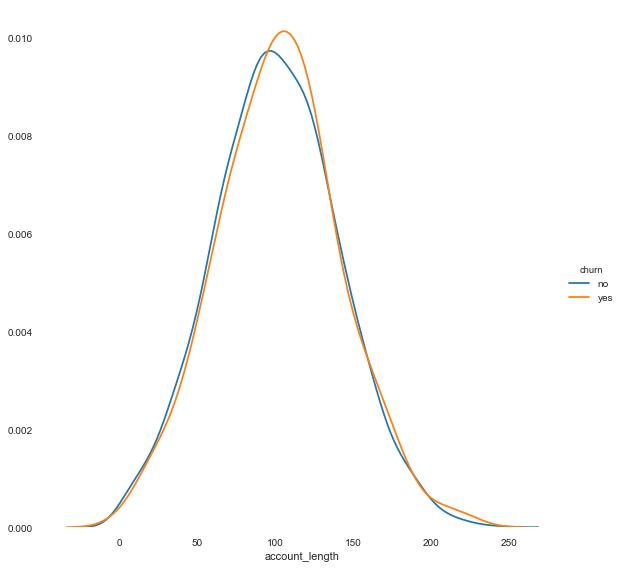

In [18]:
# Distribuição da variável account_length para cliente que ja cancelaram o serviço, e para cliente que ainda tem o serviço
sn.FacetGrid(data=train, hue='churn', height=8)\
    .map(sn.kdeplot, 'account_length')\
    .add_legend();

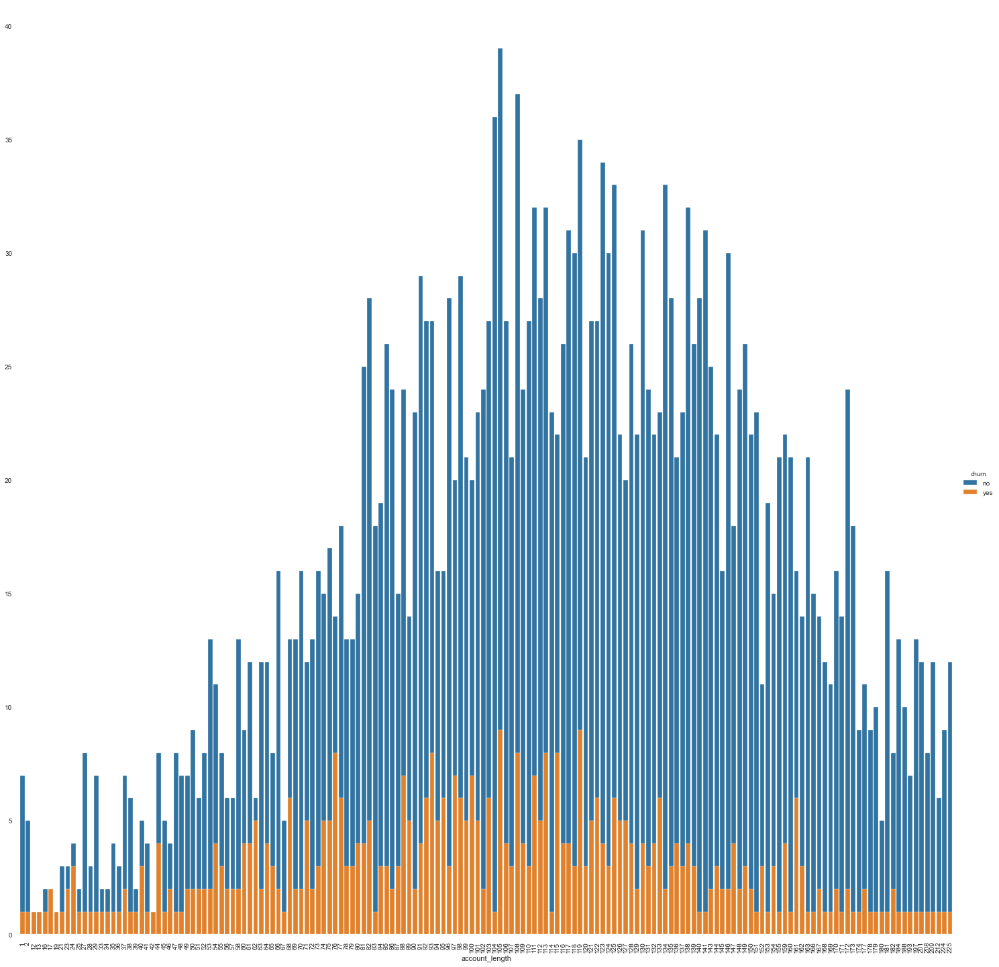

In [19]:
# Nesse gráfico, podemos ver que cliente tende a continuar usando os serviços da empresa, quando os números da variável
# account_length estão mais concetrados no centro, apesar da rotatividade dos cliente também aumentarem um pouco
sn.FacetGrid(data=train, hue='churn', height=20)\
    .map(sn.countplot, 'account_length')\
    .add_legend()
plt.xticks(rotation=90);

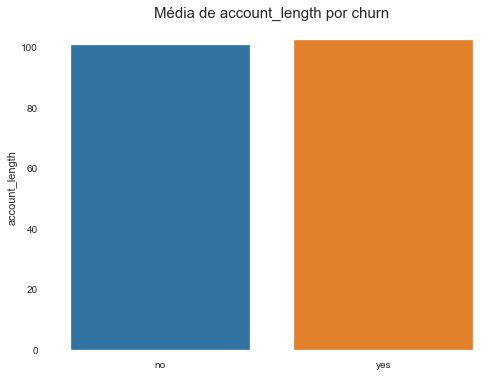

In [20]:
# Média de account_length por churn
plt.figure(figsize=(8,6))
y = train.groupby('churn')['account_length'].mean()
x = np.array(['no','yes'])
sn.barplot(x=x, y=y);
plt.title('Média de account_length por churn', fontsize=15);

### Variável area_code
### *Esta variável deveria ser do tipo inteiro, mas como contém palavras nos dados, ela foi caracterizada como string, vamos arrumar isso deixando apenas os números como dados.*

In [21]:
# Visualizando o dataframe
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,area_code_415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,no
2,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
3,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
4,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
5,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no


In [22]:
# Tipo da variável area_code
print(train['area_code'].dtype)

object


In [23]:
# Usando o método replace, removemos todas as letras e o símbolo '_', e já convertemos para o tipo inteiro
train['area_code'] = train['area_code'].replace('[a-z_]', '', regex = True).astype(int)
train['area_code'].dtype

dtype('int32')

In [24]:
# Quantidade de vezes que os valores da variável aparece
train['area_code'].value_counts()

415    1655
510     840
408     838
Name: area_code, dtype: int64

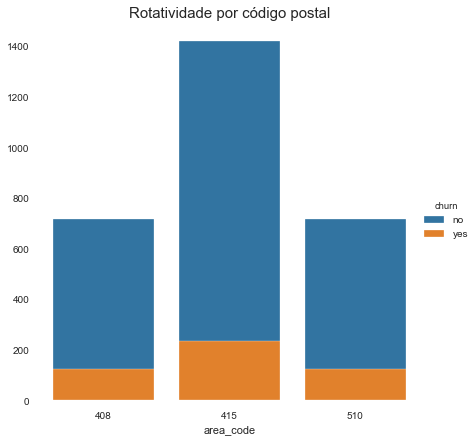

In [25]:
# Qual código de postal tem mais rotatividade ?
sn.FacetGrid(data=train, hue='churn', height=6)\
    .map(sn.countplot, 'area_code')\
    .add_legend()
plt.title('Rotatividade por código postal', fontsize=15);

### Variável International plan 

In [26]:
# Visualizando as primeiras linhas do dataframe
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,no
2,OH,107,415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
3,NJ,137,415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
4,OH,84,408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
5,OK,75,415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no


In [27]:
# Quantidade de clientes que tem o serviço do plano internacional
train['international_plan'].value_counts()

no     3010
yes     323
Name: international_plan, dtype: int64

In [28]:
# Proporção de clientes que tem o serviço
train['international_plan'].value_counts(normalize=True)

no     0.90309
yes    0.09691
Name: international_plan, dtype: float64

In [29]:
# O quanto ter um plano internacional afeta a rotatividade?
# Filtrei os clientes que tem plano international, e fiz uma contagem de quantos cancelaram o serviço e quantos continuam
# com o serviço.
train[train['international_plan']=='yes'].groupby('churn')['international_plan'].count()

churn
no     186
yes    137
Name: international_plan, dtype: int64

In [30]:
# Clientes com plano internacional e sua rotatividade
train.groupby(['international_plan','churn'])['churn'].count()

international_plan  churn
no                  no       2664
                    yes       346
yes                 no        186
                    yes       137
Name: churn, dtype: int64

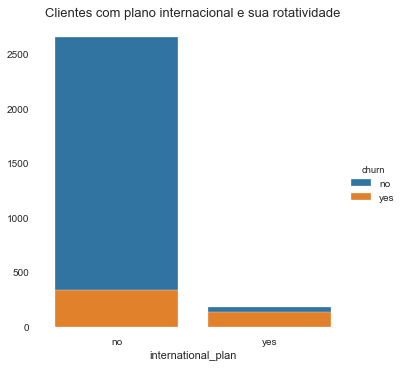

In [31]:
# Gráfico
sn.FacetGrid(data=train, hue='churn', height=5)\
            .map(sn.countplot, 'international_plan')\
            .add_legend();
plt.title('Clientes com plano internacional e sua rotatividade', fontsize=13);

### Variável voice_mail_plan

In [32]:
# Visualizando o dataset
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,no
2,OH,107,415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
3,NJ,137,415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
4,OH,84,408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
5,OK,75,415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no


no     2411
yes     922
Name: voice_mail_plan, dtype: int64




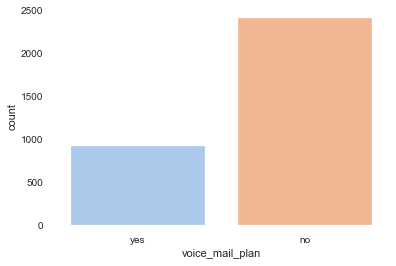

In [33]:
# Quantidade que os valores da variável aparecem
sn.countplot(data=train, x='voice_mail_plan', palette='pastel');
print(train['voice_mail_plan'].value_counts());
print('\n')

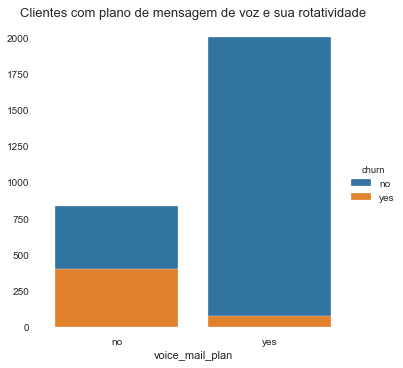

In [34]:
# Gráfico
sn.FacetGrid(data=train, hue='churn', height=5)\
            .map(sn.countplot, 'voice_mail_plan')\
            .add_legend();
plt.title('Clientes com plano de mensagem de voz e sua rotatividade', fontsize=13);

### Variáveis numéricas

In [35]:
# Filtro apenas das variáveis numéricas
train.iloc[:,5:19]

,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
2,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
3,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
4,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
5,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3329,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2
3330,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3
3331,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2
3332,0,213.8,105,36.35,159.6,84,13.57,139.2,137,6.26,5.0,10,1.35,2


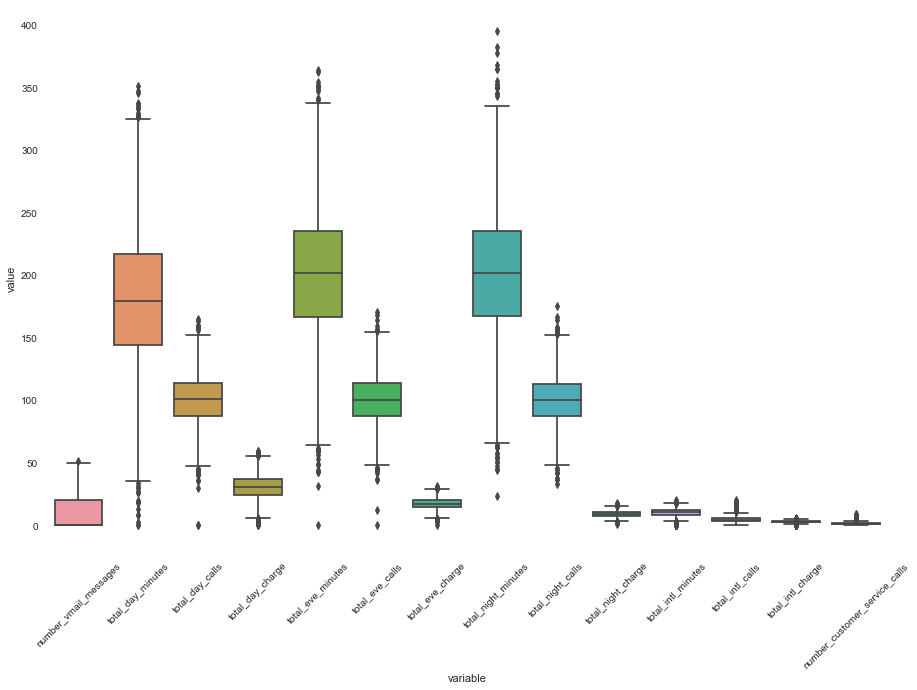

In [36]:
# Boxplot das variáveis numéricas
plt.figure(figsize=(15,10))
sn.boxplot(x="variable", y="value", data=pd.melt(train.iloc[:,5:19]))
plt.xticks(rotation=45);

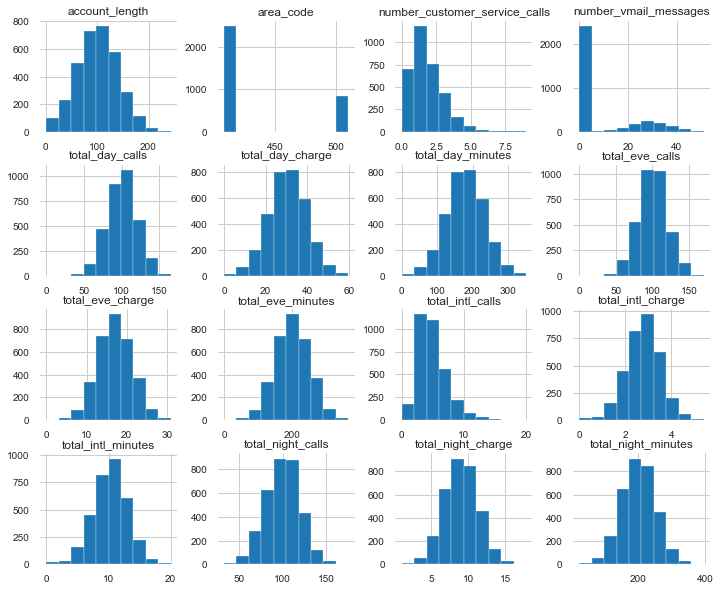

In [37]:
# Histogram das variáveis numéricas
plt.rcParams['figure.figsize']=(12,10)
train.hist();

### Relatório dos dados usando Pandas Profiling

In [38]:
# Criando o relatório e salvando em uma variável
profile = ProfileReport(train)

In [39]:
# Visualizando o relatório
profile.to_notebook_iframe()

# Pré-processamento dos dados

In [40]:
# Visualizando o dataset
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,415,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,no
2,OH,107,415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
3,NJ,137,415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
4,OH,84,408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
5,OK,75,415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no


In [41]:
# Quantidade de linhas, colunas, tipos de dados, e memória usado pelo dataset
train.info(verbose=False, memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3333 entries, 1 to 3333
Columns: 20 entries, state to churn
dtypes: float64(8), int32(1), int64(7), object(4)
memory usage: 1.4 MB


In [42]:
# Tipos de dados de cada coluna
train.dtypes

state                             object
account_length                     int64
area_code                          int32
international_plan                object
voice_mail_plan                   object
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                             object
dtype: object

## Atribuindo números as variávels do tipo object (strings)
O motivo dessa transformação, se deve ao fato de que a maioria dos modelos de machine learning, aprendem melhor as relações
das variáveis quando as mesmas são numéricas, melhorando a performance do modelo preditivo.

In [43]:
# Primeiro, vamos separar as colunas do tipo object, e atribuí-las a uma nova variáel, mais tarde iremos colocá-las
# no dataframe original, mas para manipular é melhor um dataframe menor.

train_strings = train.select_dtypes(object)

In [44]:
# Visualizando o novo dataframe apenas com as colunas do tipo object
train_strings.head()

,state,international_plan,voice_mail_plan,churn
1,KS,no,yes,no
2,OH,no,yes,no
3,NJ,no,no,no
4,OH,yes,no,no
5,OK,yes,no,no


In [45]:
# Valores únicos das colunas do dataframe
[{x:train_strings[x].unique()} for x in train_strings]

[{'state': array(['KS', 'OH', 'NJ', 'OK', 'AL', 'MA', 'MO', 'LA', 'WV', 'IN', 'RI',
         'IA', 'MT', 'NY', 'ID', 'VT', 'VA', 'TX', 'FL', 'CO', 'AZ', 'SC',
         'NE', 'WY', 'HI', 'IL', 'NH', 'GA', 'AK', 'MD', 'AR', 'WI', 'OR',
         'MI', 'DE', 'UT', 'CA', 'MN', 'SD', 'NC', 'WA', 'NM', 'NV', 'DC',
         'KY', 'ME', 'MS', 'TN', 'PA', 'CT', 'ND'], dtype=object)},
 {'international_plan': array(['no', 'yes'], dtype=object)},
 {'voice_mail_plan': array(['yes', 'no'], dtype=object)},
 {'churn': array(['no', 'yes'], dtype=object)}]

### Para as variáveis international_plan, voice_mail_plan, e churn,
### vamos atribui o valor 0 para 'no' e 1 para 'yes'

In [46]:
# Visualizandos as variáveis
train_strings.iloc[:,1:4]

,international_plan,voice_mail_plan,churn
1,no,yes,no
2,no,yes,no
3,no,no,no
4,yes,no,no
5,yes,no,no
...,...,...,...
3329,no,yes,no
3330,no,no,no
3331,no,no,no
3332,yes,no,no


In [47]:
# Transformando as strings em números com a função 'applymap' e visualizando o resultado, 
# sem alterar o dataframe original, oque iremos fazer na proxima célula.

train_strings.iloc[:,1:4].applymap(lambda x: 1 if x == 'yes' else 0)

,international_plan,voice_mail_plan,churn
1,0,1,0
2,0,1,0
3,0,0,0
4,1,0,0
5,1,0,0
...,...,...,...
3329,0,1,0
3330,0,0,0
3331,0,0,0
3332,1,0,0


In [48]:
# Atribuindo os resultados anteriores para as colunas do dataframe

train_strings[['international_plan',
               'voice_mail_plan', 
               'churn']] = train_strings.iloc[:,1:4].applymap(lambda x: 1 if x == 'yes' else 0)

In [49]:
# Checando os tipos de dados
train_strings.dtypes

state                 object
international_plan     int64
voice_mail_plan        int64
churn                  int64
dtype: object

### Variável state

In [50]:
# Visualizando o dataframe
train_strings.head()

,state,international_plan,voice_mail_plan,churn
1,KS,0,1,0
2,OH,0,1,0
3,NJ,0,0,0
4,OH,1,0,0
5,OK,1,0,0


   Podemos ver que a variável 'state', é uma variável categórica, sendo assim, o nosso modelo preditivo teria que ter dados
suficientes para cada um estado, oque não é o caso. Temos um dataset pequeno, e uma grande quantidade de estados, dessa forma, nosso modelo não irá aprender o suficiente para entender sobre as características de cada estado.
    Vou optar por não usar essa variável no modelo, então não vou aplicar transformações nela.

In [51]:
# Porcentagem da presença de cada estado no dataset
train_strings['state'].value_counts(normalize=True) * 100

WV    3.180318
MN    2.520252
NY    2.490249
AL    2.400240
OH    2.340234
OR    2.340234
WI    2.340234
VA    2.310231
WY    2.310231
CT    2.220222
MI    2.190219
VT    2.190219
ID    2.190219
UT    2.160216
TX    2.160216
IN    2.130213
KS    2.100210
MD    2.100210
MT    2.040204
NC    2.040204
NJ    2.040204
NV    1.980198
WA    1.980198
CO    1.980198
RI    1.950195
MA    1.950195
MS    1.950195
AZ    1.920192
MO    1.890189
FL    1.890189
NM    1.860186
ND    1.860186
ME    1.860186
NE    1.830183
DE    1.830183
OK    1.830183
SD    1.800180
SC    1.800180
KY    1.770177
IL    1.740174
NH    1.680168
AR    1.650165
GA    1.620162
DC    1.620162
TN    1.590159
HI    1.590159
AK    1.560156
LA    1.530153
PA    1.350135
IA    1.320132
CA    1.020102
Name: state, dtype: float64

### Atribuindo as transformações ao dataset original

In [52]:
# Aplicando as transformações
train[train_strings.columns] = train_strings

In [53]:
# Visualizando nosso dataset modificado
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
2,OH,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
3,NJ,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
4,OH,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
5,OK,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [54]:
# Tipos dos dados
train.dtypes

state                             object
account_length                     int64
area_code                          int32
international_plan                 int64
voice_mail_plan                    int64
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                              int64
dtype: object

### Variáveis categóricas
Agora vamos aplicar uma função para transformar as variáveis númericas para categóricas, algumas delas acabamos de modificar acima.

In [55]:
# Visualizando a variável codigo postal
train['area_code'].value_counts()

415    1655
510     840
408     838
Name: area_code, dtype: int64

Como temos apenas 3 valores diferentes, vamos considerar essa variável como categórica, então vamos atribuir valores de 0, 1 e 2 representando os valores 415, 510, 408 respectivamente.
Farei isso para que os pesos das variáveis categóricas sejam parecidos uns com os outros.

In [56]:
# Atribuindo os valores 
valores = {415:0, 510:1, 408:2}

# Usando list comprehension para iterar sobre os valores e salvar no datafram original
train['area_code'] = [valores[item] for item in train['area_code']] 

In [57]:
# Visualizando o dataset
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,0,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
2,OH,107,0,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
3,NJ,137,0,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
4,OH,84,2,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
5,OK,75,0,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


### Selecionando as variáveis categórica

In [58]:
# Colunas a serem modificadas
cols = ['area_code', 'international_plan', 'voice_mail_plan', 'churn' ]

In [59]:
# Transformando as colunas
train[cols] = train[cols].apply(pd.Categorical)

In [60]:
# Visualizando os tipos de dados
train.dtypes

state                              object
account_length                      int64
area_code                        category
international_plan               category
voice_mail_plan                  category
number_vmail_messages               int64
total_day_minutes                 float64
total_day_calls                     int64
total_day_charge                  float64
total_eve_minutes                 float64
total_eve_calls                     int64
total_eve_charge                  float64
total_night_minutes               float64
total_night_calls                   int64
total_night_charge                float64
total_intl_minutes                float64
total_intl_calls                    int64
total_intl_charge                 float64
number_customer_service_calls       int64
churn                            category
dtype: object

In [61]:
# Visualizando o dataframe 
train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,0,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
2,OH,107,0,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
3,NJ,137,0,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
4,OH,84,2,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
5,OK,75,0,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


# Padronização
Padronização é a técnica para transformar os atributos com distribuição Gaussiana (normal) e diferentes médias e desvios padrão em uma distribuição Gaussiana com a média igual a 0 e desvio padrão igual a 1. Isso é útil para algoritmos que esperam que os dados estejam com uma distribuição Gaussiana, como regressão linear, regressão logística e linear discriminant analysis. Funciona bem quando os dados já estão na mesma escala. O scikit-learn possui uma função para esta etapa, chamada StandardScaler(). Nesse caso, os dados ja apresentam uma distribuição normal, porém com valores das médias e desvios padrao diferente de 0 e 1.

### Aplicando padronização nas variáveis numéricas
Primeiro, vamos criar uma cópia do dataset e gravar na variável 'train1'

In [62]:
# Cópia do dataframe
train1 = train.copy()

In [63]:
# Visualizando o dataframe
train1.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,128,0,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
2,OH,107,0,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
3,NJ,137,0,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
4,OH,84,2,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
5,OK,75,0,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [64]:
# Selecionandos as variáveis numéricas e gravando em outro dataframe
numerics = train1.select_dtypes(np.number)

In [65]:
# Visualizando o dataframe com apenas as variáveis numéricas
numerics.head()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
1,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
2,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
3,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
4,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
5,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


In [66]:
# Importando pacote para padronização
from sklearn.preprocessing import StandardScaler

# Padronizando
scaled = StandardScaler().fit_transform(numerics)

# Transformando o resultado (scaled) em dataframe do pandas
scaled_df = pd.DataFrame(scaled)

# Visualizando o dataframe normalizado
scaled_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.676489,1.234883,1.566767,0.476643,1.567036,-0.070610,-0.055940,-0.070427,0.866743,-0.465494,0.866029,-0.085008,-0.601195,-0.085690,-0.427932
1,0.149065,1.307948,-0.333738,1.124503,-0.334013,-0.108080,0.144867,-0.107549,1.058571,0.147825,1.059390,1.240482,-0.601195,1.241169,-0.427932
2,0.902529,-0.591760,1.168304,0.675985,1.168464,-1.573383,0.496279,-1.573900,-0.756869,0.198935,-0.755571,0.703121,0.211534,0.697156,-1.188218
3,-0.428590,-0.591760,2.196596,-1.466936,2.196759,-2.742865,-0.608159,-2.743268,-0.078551,-0.567714,-0.078806,-1.303026,1.024263,-1.306401,0.332354
4,-0.654629,-0.591760,-0.240090,0.626149,-0.240041,-1.038932,1.098699,-1.037939,-0.276311,1.067803,-0.276562,-0.049184,-0.601195,-0.045885,1.092641


In [67]:
# Atribuindos os dados normalizados ao dataframe
train1[numerics.columns] = scaled_df

# Visualizando os dados
train1.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,0.149065,0,0,1,1.307948,-0.333738,1.124503,-0.334013,-0.108080,0.144867,-0.107549,1.058571,0.147825,1.059390,1.240482,-0.601195,1.241169,-0.427932,0
2,OH,0.902529,0,0,1,-0.591760,1.168304,0.675985,1.168464,-1.573383,0.496279,-1.573900,-0.756869,0.198935,-0.755571,0.703121,0.211534,0.697156,-1.188218,0
3,NJ,-0.428590,0,0,0,-0.591760,2.196596,-1.466936,2.196759,-2.742865,-0.608159,-2.743268,-0.078551,-0.567714,-0.078806,-1.303026,1.024263,-1.306401,0.332354,0
4,OH,-0.654629,2,1,0,-0.591760,-0.240090,0.626149,-0.240041,-1.038932,1.098699,-1.037939,-0.276311,1.067803,-0.276562,-0.049184,-0.601195,-0.045885,1.092641,0
5,OK,0.425335,0,1,0,-0.591760,0.801056,-0.121381,0.801216,0.386928,0.044463,0.386648,0.059881,0.914473,0.061821,-1.410498,0.617898,-1.412550,-1.188218,0


In [68]:
# Podemos ver que essa transformação, gerou alguns valores NaN
# Vamos completar esses valores com o número 0
train1.isna().sum()

state                            0
account_length                   1
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            1
total_day_minutes                1
total_day_calls                  1
total_day_charge                 1
total_eve_minutes                1
total_eve_calls                  1
total_eve_charge                 1
total_night_minutes              1
total_night_calls                1
total_night_charge               1
total_intl_minutes               1
total_intl_calls                 1
total_intl_charge                1
number_customer_service_calls    1
churn                            0
dtype: int64

In [69]:
# Preenchendo os valores missing
train1.fillna(0, inplace=True)

# Análise de correlação
A correlação é o relacionamento entre 2 variáveis. O método mais comum para calcular correlação é o método de Pearson, que assume uma distribuição normal dos dados. Correlação de -1 mostra uma correlação negativa, enquanto uma correlação de +1 mostra uma correlação positiva. Uma correlação igual a 0 mostra que não há relacionamento entre as variáveis.

Alguns algoritmos como regressão linear e regressão logística podem apresentar problemas de performance se houver atributos altamente correlacionados (colineares).

In [70]:
# Correlação de Pearson com as variáveis numéricas
train1.corr(method = 'pearson')

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
account_length,1.000000,-0.004880,0.005901,0.038377,0.005899,-0.006743,0.019273,-0.006731,-0.009133,-0.013083,-0.009137,0.009532,0.020786,0.009564,-0.003709
number_vmail_messages,-0.004880,1.000000,0.000198,-0.009727,0.000195,0.017592,-0.005845,0.017608,0.007362,0.007297,0.007345,0.002888,0.014184,0.002916,-0.013107
total_day_minutes,0.005901,0.000198,1.000000,0.006529,1.000000,0.007078,0.015801,0.007065,0.003918,0.023201,0.003895,-0.010118,0.008320,-0.010055,-0.013227
total_day_calls,0.038377,-0.009727,0.006529,1.000000,0.006531,-0.021442,0.006470,-0.021440,0.022817,-0.019492,0.022806,0.021578,0.004661,0.021679,-0.018882
total_day_charge,0.005899,0.000195,1.000000,0.006531,1.000000,0.007085,0.015801,0.007072,0.003918,0.023201,0.003895,-0.010121,0.008318,-0.010058,-0.013231
total_eve_minutes,-0.006743,0.017592,0.007078,-0.021442,0.007085,1.000000,-0.011431,1.000000,-0.012567,0.007576,-0.012576,-0.011037,0.002529,-0.011068,-0.012994
total_eve_calls,0.019273,-0.005845,0.015801,0.006470,0.015801,-0.011431,1.000000,-0.011424,-0.002078,0.007702,-0.002042,0.008701,0.017425,0.008672,0.002415
total_eve_charge,-0.006731,0.017608,0.007065,-0.021440,0.007072,1.000000,-0.011424,1.000000,-0.012575,0.007586,-0.012584,-0.011044,0.002529,-0.011076,-0.012997
total_night_minutes,-0.009133,0.007362,0.003918,0.022817,0.003918,-0.012567,-0.002078,-0.012575,1.000000,0.011327,0.999999,-0.015187,-0.012199,-0.015159,-0.009178
total_night_calls,-0.013083,0.007297,0.023201,-0.019492,0.023201,0.007576,0.007702,0.007586,0.011327,1.000000,0.011310,-0.013617,0.000221,-0.013643,-0.012862


### Heatmap
Como podemos ver no mapa de correlação abaixo, as variáveis que mostram a quantidade de minutos representam a mesma (ou quase a mesma) informação das variáveis de recarga, considerando o mesmo período do dia. 
Por exemplo: total_day_minutes representa a mesma informação, ou seja, são colineares. 
Isso pode atrapalhar o desempenho do modelo preditivo

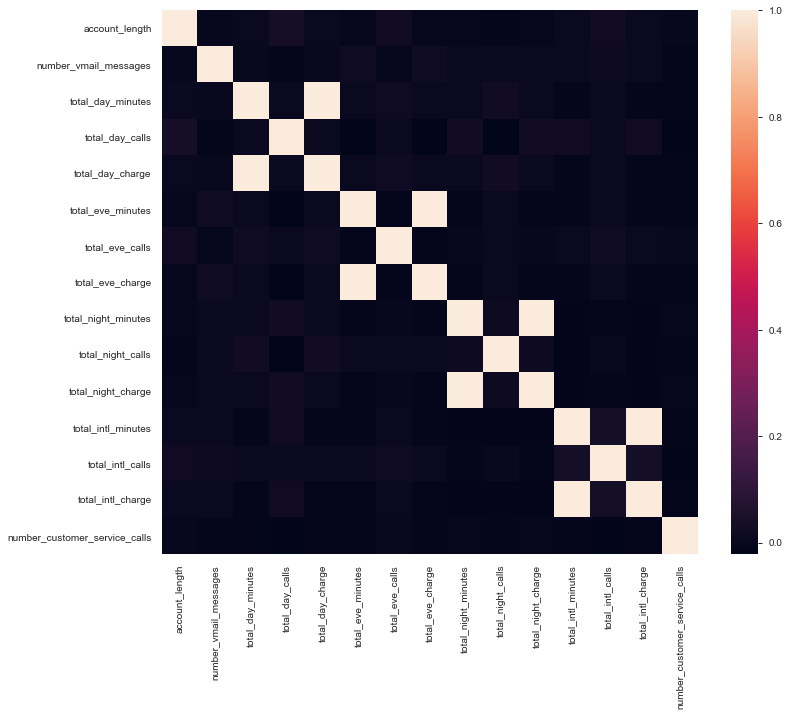

In [71]:
# Heatmap
cor = train1.corr(method = 'pearson')
sn.heatmap(cor)

# Feature Selection
A etapa de Feature Selection é onde selecionamos os atributos (variáveis) que serão melhores candidatas a variáveis preditoras. O Feature Selection nos ajuda a reduzir o overfitting (quando o algoritmo aprende demais), aumenta a acurácia do modelo e reduz o tempo de treinamento.

In [72]:
# Visualizando o nosso conjunto de dados
train1.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,KS,0.149065,0,0,1,1.307948,-0.333738,1.124503,-0.334013,-0.108080,0.144867,-0.107549,1.058571,0.147825,1.059390,1.240482,-0.601195,1.241169,-0.427932,0
2,OH,0.902529,0,0,1,-0.591760,1.168304,0.675985,1.168464,-1.573383,0.496279,-1.573900,-0.756869,0.198935,-0.755571,0.703121,0.211534,0.697156,-1.188218,0
3,NJ,-0.428590,0,0,0,-0.591760,2.196596,-1.466936,2.196759,-2.742865,-0.608159,-2.743268,-0.078551,-0.567714,-0.078806,-1.303026,1.024263,-1.306401,0.332354,0
4,OH,-0.654629,2,1,0,-0.591760,-0.240090,0.626149,-0.240041,-1.038932,1.098699,-1.037939,-0.276311,1.067803,-0.276562,-0.049184,-0.601195,-0.045885,1.092641,0
5,OK,0.425335,0,1,0,-0.591760,0.801056,-0.121381,0.801216,0.386928,0.044463,0.386648,0.059881,0.914473,0.061821,-1.410498,0.617898,-1.412550,-1.188218,0


In [73]:
# Vou fazer uma cópia do dataframe, removendo a coluna 'state', pois não vou usá-la no modelo preditivo
train2 = train1.iloc[:,1:]

In [74]:
# Visualizando o novo dataframe
train2.head()

,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,0.149065,0,0,1,1.307948,-0.333738,1.124503,-0.334013,-0.108080,0.144867,-0.107549,1.058571,0.147825,1.059390,1.240482,-0.601195,1.241169,-0.427932,0
2,0.902529,0,0,1,-0.591760,1.168304,0.675985,1.168464,-1.573383,0.496279,-1.573900,-0.756869,0.198935,-0.755571,0.703121,0.211534,0.697156,-1.188218,0
3,-0.428590,0,0,0,-0.591760,2.196596,-1.466936,2.196759,-2.742865,-0.608159,-2.743268,-0.078551,-0.567714,-0.078806,-1.303026,1.024263,-1.306401,0.332354,0
4,-0.654629,2,1,0,-0.591760,-0.240090,0.626149,-0.240041,-1.038932,1.098699,-1.037939,-0.276311,1.067803,-0.276562,-0.049184,-0.601195,-0.045885,1.092641,0
5,0.425335,0,1,0,-0.591760,0.801056,-0.121381,0.801216,0.386928,0.044463,0.386648,0.059881,0.914473,0.061821,-1.410498,0.617898,-1.412550,-1.188218,0


In [75]:
# Tipos de dados do nosso dataframe e suas respectivas quantidade de colunas
train2.dtypes.value_counts()

float64     15
category     3
category     1
dtype: int64

In [76]:
# Formato
train2.shape

(3333, 19)

### Criando as variáveis de input e output dos dados de treino

In [80]:
# Variáveis preditoras
x_treino = train2.iloc[:,0:19] 

# Variável target (churn)
y_treino = train2.iloc[:,18]

In [81]:
# Visualizando as features (x)
x_treino.head()

,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,0.149065,0,0,1,1.307948,-0.333738,1.124503,-0.334013,-0.108080,0.144867,-0.107549,1.058571,0.147825,1.059390,1.240482,-0.601195,1.241169,-0.427932,0
2,0.902529,0,0,1,-0.591760,1.168304,0.675985,1.168464,-1.573383,0.496279,-1.573900,-0.756869,0.198935,-0.755571,0.703121,0.211534,0.697156,-1.188218,0
3,-0.428590,0,0,0,-0.591760,2.196596,-1.466936,2.196759,-2.742865,-0.608159,-2.743268,-0.078551,-0.567714,-0.078806,-1.303026,1.024263,-1.306401,0.332354,0
4,-0.654629,2,1,0,-0.591760,-0.240090,0.626149,-0.240041,-1.038932,1.098699,-1.037939,-0.276311,1.067803,-0.276562,-0.049184,-0.601195,-0.045885,1.092641,0
5,0.425335,0,1,0,-0.591760,0.801056,-0.121381,0.801216,0.386928,0.044463,0.386648,0.059881,0.914473,0.061821,-1.410498,0.617898,-1.412550,-1.188218,0


In [82]:
# Visualizando a variável target
y_treino.head()

1    0
2    0
3    0
4    0
5    0
Name: churn, dtype: category
Categories (2, int64): [0, 1]

### Método Ensemble para Seleção de Variáveis
Bagged Decision Trees, como o algoritmo RandomForest (esses são chamados de Métodos Ensemble), podem ser usados para estimar a importância de cada atributo. Esse método retorna um score para cada atributo.

Quanto maior o score, maior a importância do atributo.

In [177]:
# Importância do Atributo com o Extra Trees Classifier

# Import
from sklearn.ensemble import ExtraTreesClassifier

# Criação do Modelo - Feature Selection
modelo = ExtraTreesClassifier()\
        .fit(x_treino, y_treino) # Variáveis de input e output (churn)

# Print dos Resultados

print(f'As 5 variáveis escolhidas (excluindo churn) são:\n {train2.iloc[:,modelo.feature_importances_.argsort()[-6:]].columns}')

As 5 variáveis escolhidas (excluindo churn) são:
 Index(['total_eve_charge', 'total_night_minutes', 'total_eve_calls',
       'voice_mail_plan', 'international_plan', 'churn'],
      dtype='object')


###  Eliminação Recursiva de Atributos
Esta é outra técnica para seleção de atributos, que recursivamente remove os atributos e constrói o modelo com os atributos remanescentes. Esta técnica utiliza a acurácia do modelo para identificar os atributos que mais contribuem para prever a variável alvo. Em inglês esta técnia é chamada Recursive Feature Elimination (RFE).

O exemplo abaixo utiliza a técnica de eliminação recursiva de atributos com um algoritmo de Regressão Logística para selecionar as 3 melhores variáveis preditoras. O RFE seleciona as melhores variáveis, que estão marcadas como True em "Atributos Selecionados" e com valor 1 em "Ranking dos Atributos".

In [159]:
# Eliminação Recursiva de Variáveis

# Import dos módulos
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# Criação do modelo
modelo = LogisticRegression()

# RFE
rfe = RFE(modelo, 6) # Selecinando as 6 melhores
fit = rfe.fit(x_treino, y_treino)

# Print dos resultados
print("Variáveis Selecionadas: %s" % train2.columns[fit.support_ == True])
print("Ranking dos Atributos: %s" % fit.ranking_)

Variáveis Selecionadas: Index(['account_length', 'international_plan', 'voice_mail_plan',
       'total_eve_calls', 'total_intl_minutes', 'churn'],
      dtype='object')
Ranking dos Atributos: [ 1  9  1  1 10  7  6  3 11  1 14  8 13 12  1  5  2  4  1]


### Dados de Teste
Para treinarmos o nosso modelo de machine learning, precisamos dos dados de treino e teste, como ja temos os dados de teste, vou carregar o dataset, e aplicar todas as transformações que apliquei ao dataset de treino.

In [184]:
# Carregando o conjunto de dados no formato CSV e atribuindo a variável 'test'
test = pd.read_csv('projeto4_telecom_teste.csv', index_col=[0])

In [100]:
# Visualizando o dataframe
test.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,HI,101,area_code_510,no,no,0,70.9,123,12.05,211.9,73,18.01,236.0,73,10.62,10.6,3,2.86,3,no
2,MT,137,area_code_510,no,no,0,223.6,86,38.01,244.8,139,20.81,94.2,81,4.24,9.5,7,2.57,0,no
3,OH,103,area_code_408,no,yes,29,294.7,95,50.10,237.3,105,20.17,300.3,127,13.51,13.7,6,3.70,1,no
4,NM,99,area_code_415,no,no,0,216.8,123,36.86,126.4,88,10.74,220.6,82,9.93,15.7,2,4.24,1,no
5,SC,108,area_code_415,no,no,0,197.4,78,33.56,124.0,101,10.54,204.5,107,9.20,7.7,4,2.08,2,no


In [101]:
# Tipos de dados
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1667 entries, 1 to 1667
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          1667 non-null   object 
 1   account_length                 1667 non-null   int64  
 2   area_code                      1667 non-null   object 
 3   international_plan             1667 non-null   object 
 4   voice_mail_plan                1667 non-null   object 
 5   number_vmail_messages          1667 non-null   int64  
 6   total_day_minutes              1667 non-null   float64
 7   total_day_calls                1667 non-null   int64  
 8   total_day_charge               1667 non-null   float64
 9   total_eve_minutes              1667 non-null   float64
 10  total_eve_calls                1667 non-null   int64  
 11  total_eve_charge               1667 non-null   float64
 12  total_night_minutes            1667 non-null   f

### Transformações nos dados de Teste

In [185]:
# Transformações

# Separando as variáveis do tipo Object (string)
test_strings = test.select_dtypes(object)

# Transformando as strings em números com a função 'applymap'.
test_strings1 = test_strings.iloc[:,2:5].applymap(lambda x: 1 if x == 'yes' else 0)

# Aplicando as transformações
test[test_strings1.columns] = test_strings1

# Atribuindo os valores para a variável area_code
valores = {'area_code_415':0, 'area_code_510':1, 'area_code_408':2}

# Usando list comprehension para iterar sobre os valores e salvar no datafram original
test['area_code'] = [valores[item] for item in test['area_code']] 

# Colunas a serem categorizadas
cols = ['area_code', 'international_plan', 'voice_mail_plan', 'churn' ]

# Transformando as colunas
test[cols] = test[cols].apply(pd.Categorical)

# Cópia do dataframe
test1 = test.copy()

# Selecionandos as variáveis numéricas e gravando em outro dataframe
numerics = test1.select_dtypes(np.number)

# Padronizando
scaled = StandardScaler().fit_transform(numerics)

# Transformando o resultado (scaled) em dataframe do pandas
scaled_df = pd.DataFrame(scaled)

# Atribuindos os dados normalizados ao dataframe
test1[numerics.columns] = scaled_df

# Vou fazer uma cópia do dataframe, removendo a coluna 'state', pois não vou usá-la no modelo preditivo
test2 = test1.iloc[:,1:]

# Preenchendo os valores NaN's com o valor 0
test2.fillna(0, inplace = True)

# Visualizando o dataframe de teste transformado
test2.head()

,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
1,0.973708,1,0,0,-0.534172,0.802100,-0.684070,0.801816,0.893126,1.969009,0.893550,-2.087012,-0.895277,-2.086699,-0.300401,1.084952,-0.294314,-1.231163,0
2,0.110522,1,0,0,1.657600,2.150828,-0.218264,2.150886,0.743776,0.237146,0.743613,2.000499,1.325740,1.998940,1.255817,0.676041,1.256722,-0.454641,0
3,0.008970,2,0,1,-0.534172,0.673108,1.230910,0.673493,-1.464604,-0.628785,-1.465605,0.419836,-0.846994,0.421099,1.996874,-0.959605,1.997925,-0.454641,0
4,0.237461,0,0,0,-0.534172,0.305101,-1.098120,0.305261,-1.512396,0.033398,-1.512460,0.100530,0.360080,0.099360,-0.967352,-0.141782,-0.966887,0.321882,0
5,0.465951,0,0,0,-0.534172,0.857112,-0.735826,0.857609,-1.161922,-1.647527,-1.161047,0.467435,-0.460730,0.469580,-1.263775,0.267129,-1.268859,-0.454641,0


In [186]:
# Separando variáveis de input(x) e output(y) dos dados de teste

# Variáveis preditoras de teste
x_teste = test2.iloc[:,:19]

# Variável target de teste
y_teste = test2.iloc[:,18]

# Modelos preditivos
Vamos usar o aprendizado de máquina, para prever o churn do nosso conjunto de dados, ele vai classificar a variável alvo com o número 0 ou 1 com uma certa acurácia. O nosso objetivo é obter 75% de acurácia ou mais.
Para isso, vamos utilizar o os dados de treino  e teste, nos quais ja fizemos o pré-processamento nas células acima.

### Variáveis selecionadas
Vamos treinar e testar os modelos com as variáveis escolhidas com os métodos ExtraTreesClassifier e RFE, as variáveis únicas escolhidas são: 
**'account_length',
 'international_plan',
 'total_eve_calls',
 'total_eve_charge',
 'total_intl_minutes',
 'total_night_minutes',
 'voice_mail_plan'**

In [187]:
# Salvando as variáveis em uma lista:
cols = ['account_length', 'international_plan', 'total_eve_calls', 'total_eve_charge', 
        'total_intl_minutes', 'total_night_minutes', 'voice_mail_plan']

### Regressão Logística
Algoritmo Linear. O algoritmo de Regressão Logística assume que seus dados estão em uma Distribuição Normal para valores numéricos que podem ser modelados com classificação binária.

In [199]:
# Importando pacote para calcular a acurácia
from sklearn.metrics import classification_report

# Criando o modelo
modelo = LogisticRegression()

# Treinamento do modelo
modelo.fit(x_treino[cols], y_treino)

# Previsões
previsoes = modelo.predict(x_teste[cols])
report = classification_report(y_teste, previsoes)

# Imprimindo o relatório
print(report)

              precision    recall  f1-score   support

           0       0.87      0.99      0.93      1443
           1       0.59      0.06      0.11       224

    accuracy                           0.87      1667
   macro avg       0.73      0.53      0.52      1667
weighted avg       0.83      0.87      0.82      1667



### SVM - Support Vector Machines
O objetivo deste algoritmo é buscar uma linha que melhor separa duas classes dentro de um conjunto de dados. As instâncias de dados que estão mais próximas desta linha que separa as classes, são chamadas support vectors. O SVM tem sido estendido para suportar multiclasses.

Support Vector Machines são algoritmos de classificação muito poderosos. Quando usados em conjunto com “Random forest” e outras ferramentas de aprendizagem de máquina, dão uma dimensão muito diferente para montagem de modelos. Assim, eles se tornam cruciais para os casos em que é necessária um poder de previsão muito elevado. Esses algoritmos são um pouco mais difíceis de visualizar devido à complexidade na formulação.

In [204]:
# Importando o modelo
from sklearn.svm import SVC

# Criando o modelo
modelo = SVC()

# Treinando o modelo
modelo.fit(x_treino[cols], y_treino)

# Previsões
previsoes = modelo.predict(x_teste[cols])
report = classification_report(y_teste, previsoes)

# Imprimindo o relatório
print(report)

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      1443
           1       0.00      0.00      0.00       224

    accuracy                           0.87      1667
   macro avg       0.43      0.50      0.46      1667
weighted avg       0.75      0.87      0.80      1667



### Random Forest
Random Forest é uma extensão do Baggig Decision Tree. Amostras do dataset de treino são usadas com reposição, mas as árvores são criadas de uma forma que reduz a correlação entre classificadores individuais (Random Forest é um conjunto de árvores de decisão).

In [205]:
# Importando o modelo
from sklearn.ensemble import RandomForestClassifier

# Criando o modelo
modelo = RandomForestClassifier()

# Treinando o modelo
modelo.fit(x_treino[cols], y_treino)

# Resultado
resultado = modelo.predict(x_teste[cols])
report = classification_report(y_teste, previsoes)

# Imprimindo o relatório
print(report)

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      1443
           1       0.00      0.00      0.00       224

    accuracy                           0.87      1667
   macro avg       0.43      0.50      0.46      1667
weighted avg       0.75      0.87      0.80      1667



### Otimização do Modelo - Ajuste de Hyperparâmetros
Todos os algoritmos de Machine Learning são parametrizados, o que significa que você pode ajustar a performance do seu modelo preditivo, através do tuning (ajuste fino) dos parâmetros. Esse processo também é chamado de Otimização de Hyperparâmetros.

### Grid Search Parameter Tuning
Este método realiza metodicamente combinações entre todos os parâmetros do algoritmo, criando um grid. Vamos experimentar este método utilizando o algoritmo de Regressão Logística.

In [209]:
# Import do grid
from sklearn.model_selection import GridSearchCV

# Definindo os valores que serão testados
valores_grid = {'penalty': ['l1','l2'], 'C': [0.001,0.01,0.1,1,10,100,1000]}

# Criando o modelo
modelo = LogisticRegression()

# Criando o grid
grid = GridSearchCV(estimator = modelo, param_grid = valores_grid)
grid.fit(x_treino[cols], y_treino)

# Print do resultado
print("Acurácia: %.3f" % (grid.best_score_ * 100))
print("Melhores Parâmetros do Modelo:\n", grid.best_estimator_)

Acurácia: 85.539
Melhores Parâmetros do Modelo:
 LogisticRegression(C=0.1)


### Utilizando o modelo Regressão Logística otimizado

In [212]:
# Criando o modelo
modelo = LogisticRegression(C=0.1)

# Treinamento do modelo
modelo.fit(x_treino[cols], y_treino)

# Previsões
previsoes = modelo.predict(x_teste[cols])
report = classification_report(y_teste, previsoes)

# Imprimindo o relatório
print(report)

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      1443
           1       0.00      0.00      0.00       224

    accuracy                           0.87      1667
   macro avg       0.43      0.50      0.46      1667
weighted avg       0.75      0.87      0.80      1667



# <font color = 'blue'> Conclusão <font>
Podemos concluir que o nosso modelo LogisticRegression teve a melhor performance com 83% de acurácia na média.
Apesar de termos usado um otimizador dos parâmetros para melhorar o modelo, isso acabou piorando a performance, diminuindo a acurácia para 75% na média.
O resultado poderia ter sido melhor se tivessemos mais dados, principalmente para o modelo aprender mais sobre os clientes que cancelaram o serviço Telecom (Churn = 1).

# Obrigado
### Dener Moreira